### Lending case Study Notebook ###

### Business understanding ###
When the company receives a loan application, the company has to make a decision for loan approval based on the applicant’s profile. Two types of risks are associated with the bank’s decision:
• If the applicant is likely to repay the loan, then not approving the loan results in a loss of business to the company
• If the applicant is not likely to repay the loan, i.e. he/she is likely to default, then approving the loan may lead to a financial loss for the company

### Problem statement
The aim is to identify patterns which indicate if a person is likely to default, which may be used for taking actions such as denying the loan, reducing the amount of loan, lending (to risky applicants) at a higher interest rate, etc.


### Data Handling & Cleaning ###
# Approach 
1. understand the data dictionary
2. browse the data set
3. observe the rows & columns
   3.1 Fix rows and columns
   3.2 Fix missing values
   3.3 standardise values
   3.4 fix invalid values
   3.5 filter data


### Library imports 

In [120]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
import plotly.express as px #plotting

### Reading the data set 

In [5]:
inp_lend1 = pd.read_csv("loan.csv")
inp_lend1.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


### Understand the structure of the data set

In [7]:
inp_lend1.shape

(39717, 111)

In [9]:
inp_lend1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


In [11]:
inp_lend1.dtypes

id                              int64
member_id                       int64
loan_amnt                       int64
funded_amnt                     int64
funded_amnt_inv               float64
                               ...   
tax_liens                     float64
tot_hi_cred_lim               float64
total_bal_ex_mort             float64
total_bc_limit                float64
total_il_high_credit_limit    float64
Length: 111, dtype: object

### Data cleaning process 
### Identify missing values 

In [67]:
#Check the number of null values in the columns
inp_lend1.isnull().sum()

id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
                              ...  
tax_liens                        39
tot_hi_cred_lim               39717
total_bal_ex_mort             39717
total_bc_limit                39717
total_il_high_credit_limit    39717
Length: 111, dtype: int64

In [19]:
#find out the percentage of the columns which have empty values
(inp_lend1.isnull().sum()/inp_lend1.shape[0]*100).round(2).sort_values(ascending=False)

total_il_high_credit_limit    100.0
total_bc_limit                100.0
total_bal_ex_mort             100.0
tot_hi_cred_lim               100.0
num_bc_sats                   100.0
                              ...  
loan_status                     0.0
url                             0.0
loan_amnt                       0.0
member_id                       0.0
id                              0.0
Length: 111, dtype: float64

In [21]:
inp_lend1.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [23]:
#removing the columns which have empty values 
lend_data = inp_lend1.loc[:,inp_lend1.isnull().sum()/inp_lend1.shape[0]*100<50] 


In [25]:
lend_data.shape

(39717, 54)

In [27]:
# Calculate the percentage of the empty columns
inp_lend1.isnull().sum()/inp_lend1.shape[0]*100

id                              0.000000
member_id                       0.000000
loan_amnt                       0.000000
funded_amnt                     0.000000
funded_amnt_inv                 0.000000
                                 ...    
tax_liens                       0.098195
tot_hi_cred_lim               100.000000
total_bal_ex_mort             100.000000
total_bc_limit                100.000000
total_il_high_credit_limit    100.000000
Length: 111, dtype: float64

In [81]:
lend_data.dtypes

id                              int64
member_id                       int64
loan_amnt                       int64
funded_amnt                     int64
funded_amnt_inv               float64
term                           object
int_rate                       object
installment                   float64
grade                          object
sub_grade                      object
emp_title                      object
emp_length                     object
home_ownership                 object
annual_inc                    float64
verification_status            object
issue_d                        object
loan_status                    object
pymnt_plan                     object
url                            object
desc                           object
purpose                        object
title                          object
zip_code                       object
addr_state                     object
dti                           float64
delinq_2yrs                     int64
earliest_cr_

In [29]:
#dropping columns which will not be useful  - url , zip_code, desc
lend_data = lend_data.drop(columns=['url', 'zip_code','desc'])
lend_data.shape


(39717, 51)

In [31]:
#cheking the columns again 
lend_data.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'purpose', 'title',
       'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util',
       'total_acc', 'initial_list_status', 'out_prncp', 'out_prncp_inv',
       'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d',
       'collections_12_mths_ex_med', 'policy_code', 'application_type',
       'acc_now_delinq', 'chargeoff_within_12_mths', 'delinq_amnt',
       'pub_rec_bankruptcies', 'tax_liens'],
      dtype='object')

In [33]:
#some more columns which may not be useful can be removed
lend_data = lend_data.drop(columns=['addr_state', 'inq_last_6mths','policy_code'])

In [35]:
lend_data.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'purpose', 'title', 'dti',
       'delinq_2yrs', 'earliest_cr_line', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'initial_list_status', 'out_prncp',
       'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp',
       'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'last_credit_pull_d', 'collections_12_mths_ex_med', 'application_type',
       'acc_now_delinq', 'chargeoff_within_12_mths', 'delinq_amnt',
       'pub_rec_bankruptcies', 'tax_liens'],
      dtype='object')

In [91]:
lend_data.shape
lend_data.dtypes

id                              int64
member_id                       int64
loan_amnt                       int64
funded_amnt                     int64
funded_amnt_inv               float64
term                           object
int_rate                       object
installment                   float64
grade                          object
sub_grade                      object
emp_title                      object
emp_length                     object
home_ownership                 object
annual_inc                    float64
verification_status            object
issue_d                        object
loan_status                    object
pymnt_plan                     object
purpose                        object
title                          object
dti                           float64
delinq_2yrs                     int64
earliest_cr_line               object
open_acc                        int64
pub_rec                         int64
revol_bal                       int64
revol_util  

In [37]:
lend_data.emp_length.head(15)

0     10+ years
1      < 1 year
2     10+ years
3     10+ years
4        1 year
5       3 years
6       8 years
7       9 years
8       4 years
9      < 1 year
10      5 years
11    10+ years
12     < 1 year
13      3 years
14      3 years
Name: emp_length, dtype: object

In [93]:
lend_data.shape

(39717, 48)

In [39]:
lend_data.emp_length.isnull().sum()

1075

In [43]:
lend_data.emp_length.fillna('0',inplace=True)

In [45]:
len_data1 = lend_data

In [47]:
#updating the column cmployee lenth column
lend_data["emp_length"]=lend_data.emp_length.str.extract('(\d+)')
lend_data.emp_length.head()

0    10
1     1
2    10
3    10
4     1
Name: emp_length, dtype: object

In [49]:
lend_data.emp_length.isnull().sum()

0

In [51]:
# Checking for missing values across the rows
print((lend_data.isnull().sum(axis=1)).max())

5


### As the max number of missing value in row is very low compared to the count of columns 48 after removing irrelevant columns), we can move ahead with process as the impact is insignificant.

In [53]:
# Checking for missing values across the dataframe
print(lend_data.isnull().sum().sort_values(ascending=False))

emp_title                     2459
pub_rec_bankruptcies           697
last_pymnt_d                    71
chargeoff_within_12_mths        56
collections_12_mths_ex_med      56
revol_util                      50
tax_liens                       39
title                           11
last_credit_pull_d               2
id                               0
loan_amnt                        0
member_id                        0
funded_amnt_inv                  0
term                             0
int_rate                         0
funded_amnt                      0
issue_d                          0
verification_status              0
annual_inc                       0
home_ownership                   0
emp_length                       0
sub_grade                        0
grade                            0
installment                      0
open_acc                         0
pub_rec                          0
pymnt_plan                       0
loan_status                      0
dti                 

In [55]:
### dropping more columns
lend_data = lend_data.drop(columns=['emp_title', 'tax_liens','title', 'collection_recovery_fee' ])


In [148]:
print(lend_data.isnull().sum().sort_values(ascending=False))

last_pymnt_d                  71
collections_12_mths_ex_med    56
chargeoff_within_12_mths      56
revol_util                    50
last_credit_pull_d             2
funded_amnt_inv                0
int_rate                       0
term                           0
id                             0
member_id                      0
loan_amnt                      0
funded_amnt                    0
home_ownership                 0
emp_length                     0
sub_grade                      0
grade                          0
installment                    0
annual_inc                     0
issue_d                        0
verification_status            0
delinq_2yrs                    0
earliest_cr_line               0
pub_rec                        0
open_acc                       0
pymnt_plan                     0
purpose                        0
dti                            0
loan_status                    0
out_prncp                      0
initial_list_status            0
total_acc 

In [57]:
lend_data.pub_rec_bankruptcies.fillna('0',inplace=True)

In [59]:
## removing few more columns 
lend_data = lend_data.drop(columns=['member_id', 'grade','sub_grade', 'earliest_cr_line', 'recoveries' ])

In [61]:
# Removing duplicate rows in the dataframe
lend_data = lend_data.drop_duplicates()

In [162]:
lend_data.shape
lend_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 39 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          39717 non-null  int64  
 1   loan_amnt                   39717 non-null  int64  
 2   funded_amnt                 39717 non-null  int64  
 3   funded_amnt_inv             39717 non-null  float64
 4   term                        39717 non-null  object 
 5   int_rate                    39717 non-null  object 
 6   installment                 39717 non-null  float64
 7   emp_length                  39717 non-null  object 
 8   home_ownership              39717 non-null  object 
 9   annual_inc                  39717 non-null  float64
 10  verification_status         39717 non-null  object 
 11  issue_d                     39717 non-null  object 
 12  loan_status                 39717 non-null  object 
 13  pymnt_plan                  397

### Now, data set is free from the empty rows and columns. It is important to identify and fix the data types of the existing columns 
# Correcting data type and format for columns in the dataframe
## Derving more columns with the conversion of data type

In [176]:
lend_data.term=lend_data.term.apply(lambda x: int(x.replace(' months',''))).astype(int)
lend_data.int_rate=lend_data.int_rate.apply(lambda x:str(x).replace('%','')).astype('float').round(2)
lend_data.home_ownership=lend_data.home_ownership.astype('category')
lend_data.verification_status = lend_data.verification_status.astype('category')
lend_data.loan_status = lend_data.loan_status.astype('category')
lend_data.term.dtype

In [63]:

lend_data.purpose = lend_data.purpose.astype('category')


In [104]:
### dropping further columns 
lend_data = lend_data.drop(columns=['pymnt_plan', 'issue_d'])

### converting the columns to categorical 

In [174]:
#lend_data.loan_status = lend_data.loan_status.astype('category')
#lend_data.home_ownership = lend_data.home_ownership.astype('category')
#lend_data.verification_status = lend_data.verification_status.astype('category')
lend_data.verification_status = lend_data.verification_status.astype('category')
lend_data.int_rate=lend_data.int_rate.apply(lambda x:str(x).replace('%','')).astype('float').round(2)
lend_data.revol_util=lend_data.revol_util.apply(lambda x:str(x).replace('%','')).astype('float').round(2)

In [176]:
lend_data.revol_util.head()

0    83.7
1     9.4
2    98.5
3    21.0
4    53.9
Name: revol_util, dtype: float64

In [178]:
lend_data.dtypes

id                               int64
loan_amnt                        int64
funded_amnt                      int64
funded_amnt_inv                float64
term                            object
int_rate                       float64
installment                    float64
emp_length                      object
home_ownership                category
annual_inc                     float64
verification_status           category
loan_status                   category
purpose                       category
dti                            float64
delinq_2yrs                      int64
open_acc                         int64
pub_rec                          int64
revol_bal                        int64
revol_util                     float64
total_acc                        int64
initial_list_status             object
out_prncp                      float64
out_prncp_inv                  float64
total_pymnt                    float64
total_pymnt_inv                float64
total_rec_prncp          

In [108]:
lend_data.shape

(39717, 37)

### Identify and remove outliers using box plot 

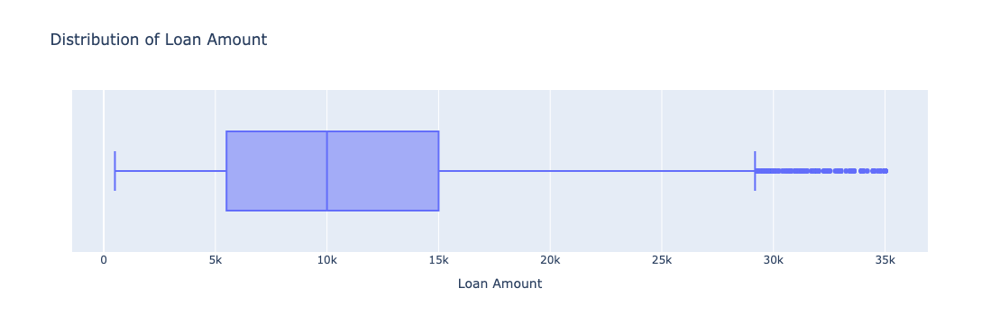

In [122]:
## starting with loan_amnt
## using plotly for interactive interaction and value retrival from chart for upper fence.
px.box(lend_data,x='loan_amnt',width=750,height=350,title='Distribution of Loan Amount',labels={'loan_amnt':'Loan Amount'}).show()
## Upper fence turns out to be 29.175k =29175 whereas max is 35k=35000 which is not much more then upper fence thus will not have much impact on the analysis.

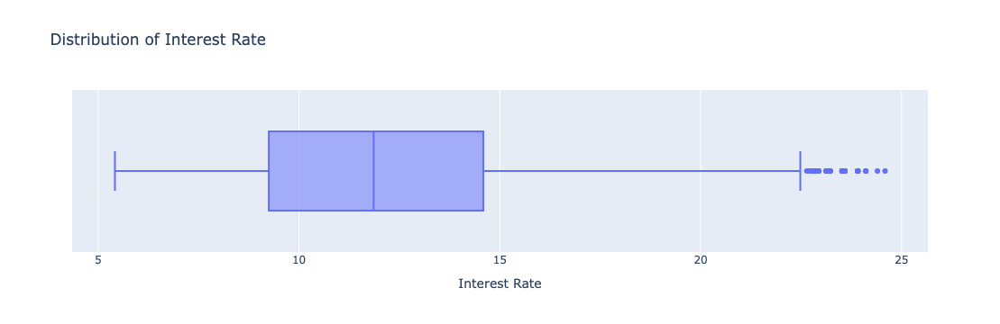

In [137]:
## starting with int_rate
## using plotly for interactive interaction and value retrival from chart for upper fence.
px.box(lend_data,x='int_rate',width=750,height=350,title='Distribution of Interest Rate',labels={'int_rate':'Interest Rate'}).show()
## Upper fence turns out to be 22.64 whereas max is 24.4 which is not much more then upper fence thus will not have much impact on the analysis.

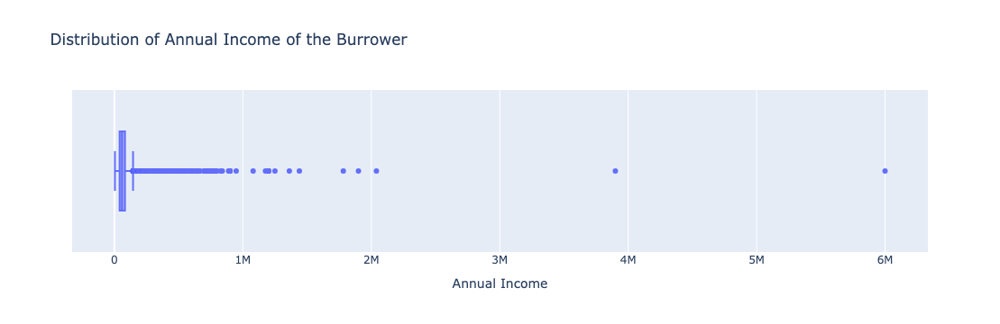

In [142]:
## starting with annual_inc
## using plotly for interactive interaction and value retrival from chart for upper fence.
px.box(lend_data,x='annual_inc',width=750,height=350,title='Distribution of Annual Income of the Burrower',labels={'annual_inc':'Annual Income'}).show()
## Upper fence turns out to be 146k whereas max is 6000k which is much from upper fence thus we will remove the outliers in column annual_inc.

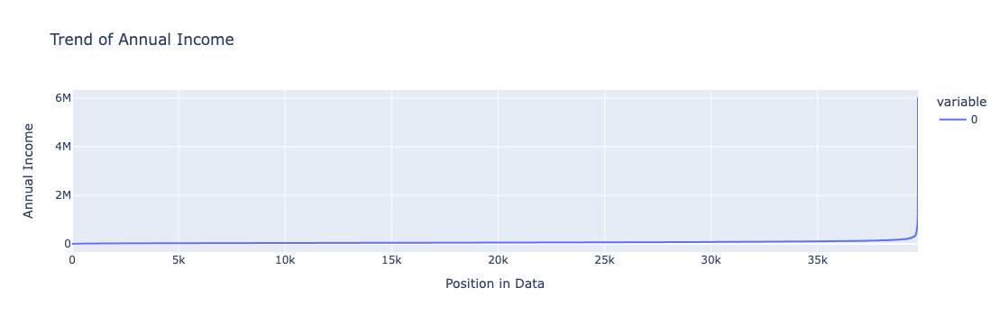

In [145]:
## checking trend of values in annual_inc using line chart to find the appropriate quantile to use to remove outliers
px.line(sorted(lend_data.annual_inc),width=750,height=350,title='Trend of Annual Income',labels={'value':'Annual Income','index':'Position in Data'}).show()

### As it can be observed from the line chart, the annual_inc is increasing in expontntial format around 99th percentile. Thus we can remove values greater than 99th percentile.


In [161]:
## Removing outliers in annual_inc greater than 99th percentile
lend_data = lend_data[lend_data.annual_inc<=np.percentile(lend_data.annual_inc,99)]
lend_data.head()

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,emp_length,home_ownership,annual_inc,...,total_rec_late_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies
0,1077501,5000,5000,4975.0,36 months,10.65,162.87,10,RENT,24000.0,...,0.00,Jan-15,171.62,May-16,0.0,INDIVIDUAL,0,0.0,0,0.0
1,1077430,2500,2500,2500.0,60 months,15.27,59.83,1,RENT,30000.0,...,0.00,Apr-13,119.66,Sep-13,0.0,INDIVIDUAL,0,0.0,0,0.0
2,1077175,2400,2400,2400.0,36 months,15.96,84.33,10,RENT,12252.0,...,0.00,Jun-14,649.91,May-16,0.0,INDIVIDUAL,0,0.0,0,0.0
3,1076863,10000,10000,10000.0,36 months,13.49,339.31,10,RENT,49200.0,...,16.97,Jan-15,357.48,Apr-16,0.0,INDIVIDUAL,0,0.0,0,0.0
4,1075358,3000,3000,3000.0,60 months,12.69,67.79,1,RENT,80000.0,...,0.00,May-16,67.79,May-16,0.0,INDIVIDUAL,0,0.0,0,0.0


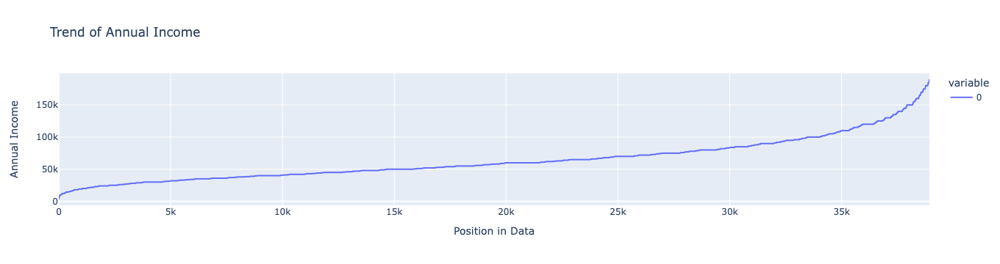

In [164]:
## checking trend of values in annual_inc using line chart to find the appropriate quantile to use to remove outliers
px.line(sorted(lend_data.annual_inc),width=750,height=350,title='Trend of Annual Income',labels={'value':'Annual Income','index':'Position in Data'}).show()

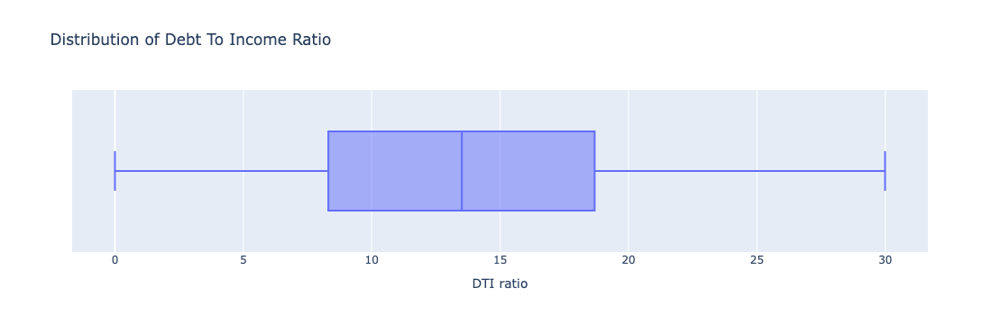

In [167]:
## starting with dti
## using plotly for interactive interaction and value retrival from chart for upper fence.
px.box(lend_data,x='dti',width=750,height=350,title='Distribution of Debt To Income Ratio',labels={'dti':'DTI ratio'}).show()
## There are no outliers in dti hence we can move ahead with analysis.

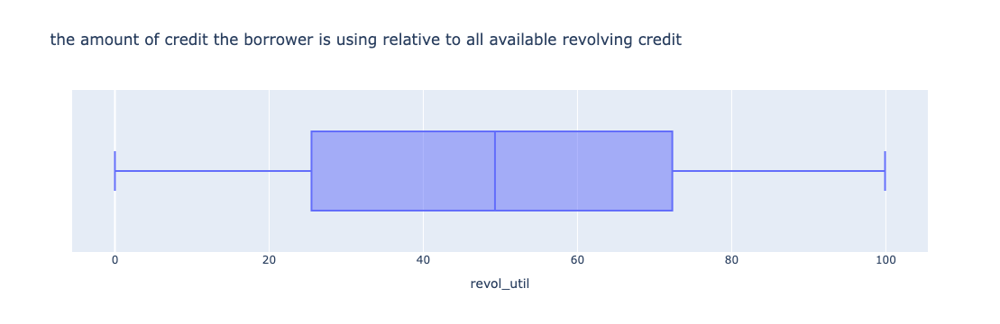

In [180]:
## starting with Revol_util
##This metric is important because lenders often consider it when assessing credit risk. Higher utilization rates can indicate that a borrower may be overextended financially, which could potentially signal a higher risk of default. 
##Lower utilization rates, on the other hand,suggest that the borrower is managing their credit responsibly and may be considered less risky by lenders.
## using plotly for interactive interaction and value retrival from chart for upper fence.
px.box(lend_data,x='revol_util',width=750,height=350,title='the amount of credit the borrower is using relative to all available revolving credit',labels={'revol_util':'revol_util '}).show()
## There are no outliers in Revol_util hence we can move ahead with analysis. borrowers whose utilization risk is higher is more likely to default

### ### Derive Columns For Analysis -

In [198]:
# Derived columns
# categorise loan amounts into buckets which will help in analysis further in bivariate analysis.
lend_data['loan_amnt_cats'] = pd.cut(lend_data['loan_amnt'], [0, 5000, 10000, 15000, 20000, 25000,30000,35000], labels=['0-5000', '5000-10000', '10000-15000', '15000-20000', '20000-25000','25000-3000','30000+'])

# categorise annual incomes into buckets which will help in analysis further in bivariate analysis.
lend_data['annual_inc_cats'] = pd.cut(lend_data['annual_inc'], [0, 20000, 40000, 60000, 80000,1000000], labels=['0-20000', '20000-40000', '40000-60000', '60000-80000', '80000 +'])

# categorise intrest rates into buckets which will help in analysis further in bivariate analysis.
lend_data['int_rate_cats'] = pd.cut(lend_data['int_rate'], [0, 10, 12.5, 16, 20], labels=['0-10', '10-13', '12.5-16', '16 +'])

# categorise dti into buckets for bivariate analysis.
lend_data['dti_cats'] = pd.cut(lend_data['dti'], [0, 5, 10, 15, 20, 25], labels=['0-5', '05-10', '10-15', '15-20', '25+'])

In [203]:
lend_data.int_rate_cats.head()

0      10-13
1    12.5-16
2    12.5-16
3    12.5-16
4    12.5-16
Name: int_rate_cats, dtype: category
Categories (4, object): ['0-10' < '10-13' < '12.5-16' < '16 +']

### Univariate Analysis - Qualitative 

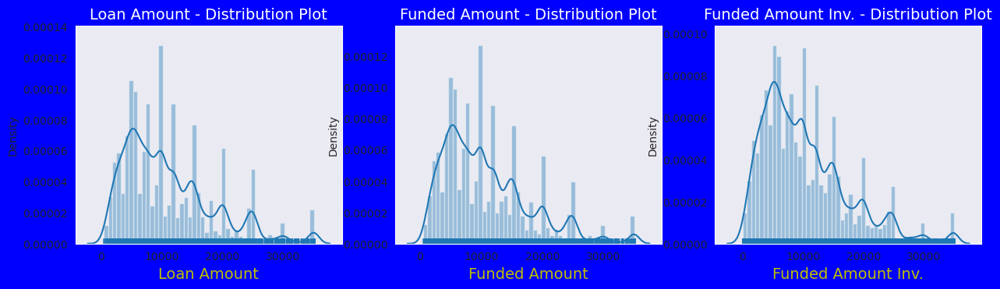

In [211]:
# Lets see distribution of three loan amount fields using distribution plot.
# Quantitative Variables
#Loan amount - The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.
# The total amount committed to that loan at that point in time.
# The total amount committed by investors for that loan at that point in time.
plt.figure(figsize=(15,8),facecolor='b')
sns.set_style("dark")
# subplot 1
plt.subplot(2, 3, 1)
ax = sns.distplot(lend_data['loan_amnt'],rug = True)
ax.set_title('Loan Amount - Distribution Plot',fontsize=14,color='w')
ax.set_xlabel('Loan Amount',fontsize=14,color='y')
# subplot 2
plt.subplot(2, 3, 2)
ax = sns.distplot(lend_data['funded_amnt'],rug = True)
ax.set_title('Funded Amount - Distribution Plot',fontsize=14,color='w')
ax.set_xlabel('Funded Amount',fontsize=14,color='y')
# subplot 2
plt.subplot(2, 3, 3)
ax = sns.distplot(lend_data['funded_amnt_inv'],rug = True)
ax.set_title('Funded Amount Inv. - Distribution Plot',fontsize=14,color='w')
ax.set_xlabel('Funded Amount Inv.',fontsize=14,color='y')
plt.show()

# Observation: 
# Distribution of amounts for all three looks very much similar. 
# We will work with only loan amount column for rest of our analysis.

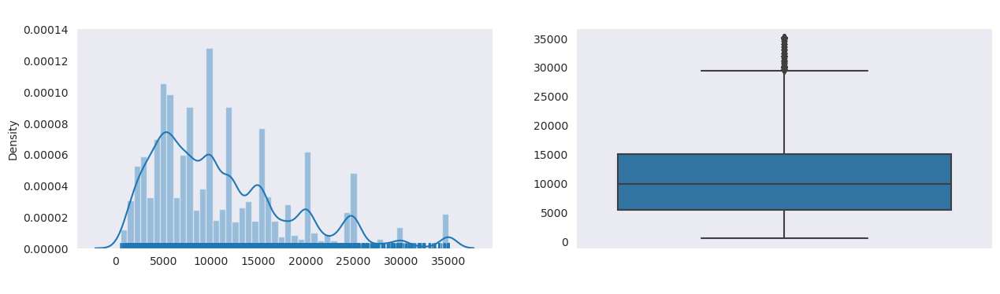

In [220]:
# Univariate Analysis on Loan amount-Quantitative Variables

plt.figure(figsize=(15,8),facecolor='w')
sns.set_style("dark")
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.distplot(lend_data['loan_amnt'],rug = True)
ax.set_title('Loan Amount - Distribution Plot',fontsize=16,color='w')
ax.set_xlabel('Loan Amount',fontsize=14,color='w')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(y=lend_data['loan_amnt'])
ax.set_title('Loan Amount - Box Plot',fontsize=16,color='w')
ax.set_ylabel('Loan Amount',fontsize=14,color='w')
plt.show()

# Observations :
# Below plots show that most of the Loan amounts are in range of 5000 - 15000

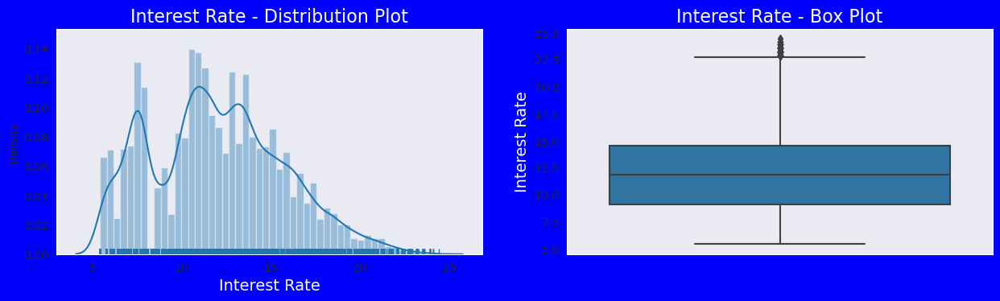

In [223]:
# Univariate Analysis on Intrest Rate-Quantitative Variables

plt.figure(figsize=(15,8),facecolor='b')
sns.set_style("dark")
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.distplot(lend_data['int_rate'],rug = True)
ax.set_title('Interest Rate - Distribution Plot',fontsize=16,color='w')
ax.set_xlabel('Interest Rate',fontsize=14,color='w')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(y=lend_data['int_rate'])
ax.set_title('Interest Rate - Box Plot',fontsize=16,color='w')
ax.set_ylabel('Interest Rate',fontsize=14,color='w')
plt.show()

# Observations :
# Below plots show that most of the Interest Rates on loans are in range of 10% - 15%

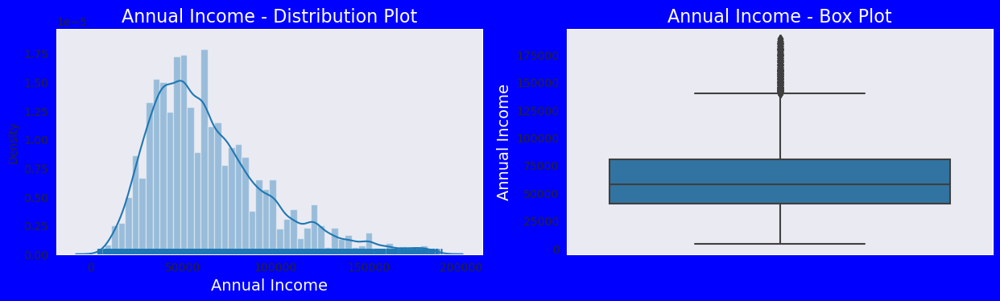

In [228]:
# Univariate Analysis on Annual Income - Quantitative Variables

plt.figure(figsize=(15,8),facecolor='b')
sns.set_style("dark")
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.distplot(lend_data['annual_inc'],rug = True)
ax.set_title('Annual Income - Distribution Plot',fontsize=16,color='w')
ax.set_xlabel('Annual Income',fontsize=14,color='w')
# subplot 2
plt.subplot(2, 2, 2)
plt.title('Annual Income - Box Plot')
ax = sns.boxplot(y=lend_data['annual_inc'])
ax.set_title('Annual Income - Box Plot',fontsize=16,color='w')
ax.set_ylabel('Annual Income',fontsize=14,color='w')
plt.show()

# Observations :
# Below plots show that most of the borrower's Annual incomes are in range of 40000- 80000

### Categorical data distribution

In [245]:
# Lets take a look on important variable loan status in total loans issued

(lend_data.loan_status.value_counts()*100)/len(lend_data)

#Based on data of the loan_status 
#Fully Paid     82.878648
#Charged Off    14.254521
#Current         2.866831

loan_status
Fully Paid     82.878648
Charged Off    14.254521
Current         2.866831
Name: count, dtype: float64

Text(0, 0.5, 'Loan Application Count')

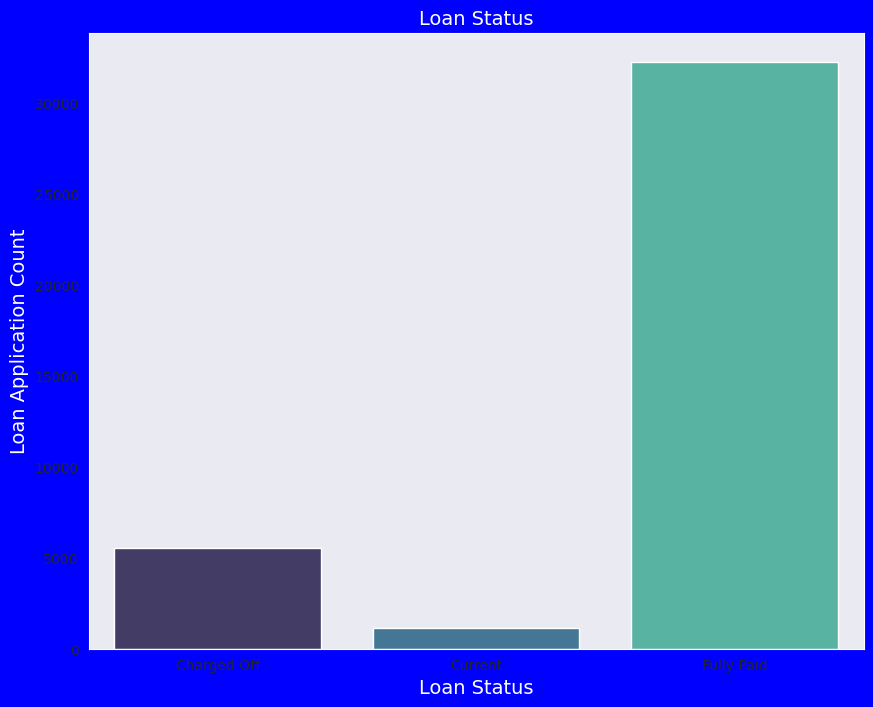

In [254]:
# Univariate Analysis - Unordered Categorical Variables - Loan Status

plt.figure(figsize=(10,8),facecolor='b')
sns.set_style("dark")
ax = sns.countplot(x="loan_status",data=lend_data,palette='mako')
ax.set_title('Loan Status',fontsize=14,color='w')
ax.set_xlabel('Loan Status',fontsize=14,color = 'w')
ax.set_ylabel('Loan Application Count',fontsize=14,color = 'w')            


# Observations :
# Below plot shows that close to 14% loans were charged off out of total loan issued.

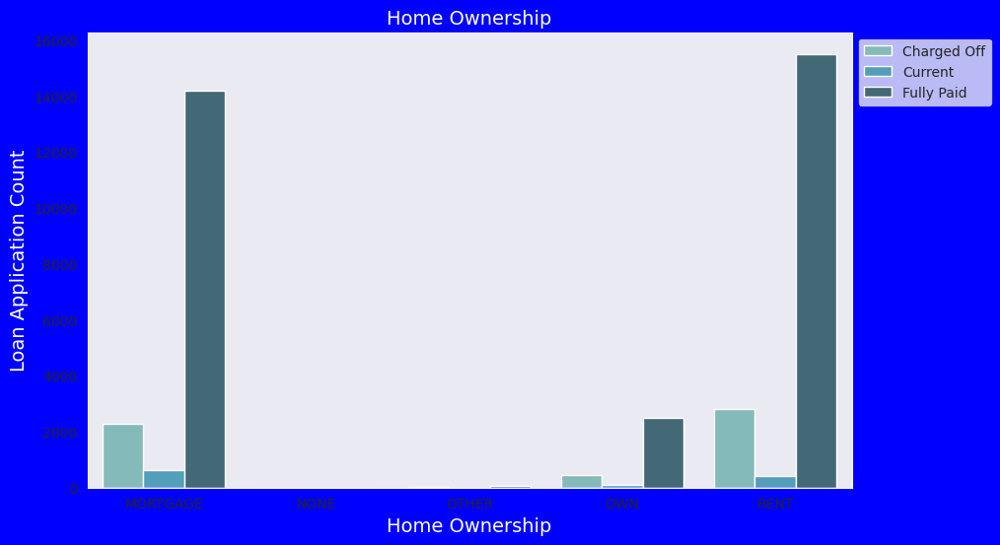

In [263]:
# Univariate Analysis - Unordered Categorical Variables - Home Ownership

plt.figure(figsize=(10,6),facecolor='b')
ax = sns.countplot(x="home_ownership",data=lend_data,hue='loan_status',palette='GnBu_d')
ax.legend(bbox_to_anchor=(1, 1))
ax.set_title('Home Ownership',fontsize=14,color='w')
ax.set_xlabel('Home Ownership',fontsize=14,color = 'w')
ax.set_ylabel('Loan Application Count',fontsize=14,color = 'w')      
plt.show()

# Observations :
# Below plot shows that most of them living in rented home or mortgazed their home have fully paid the loan
#there is a significant number of applicant whose loan has been charged off with Mortgage and rent
# Applicant numbers are high from these categories so charged off is high too.

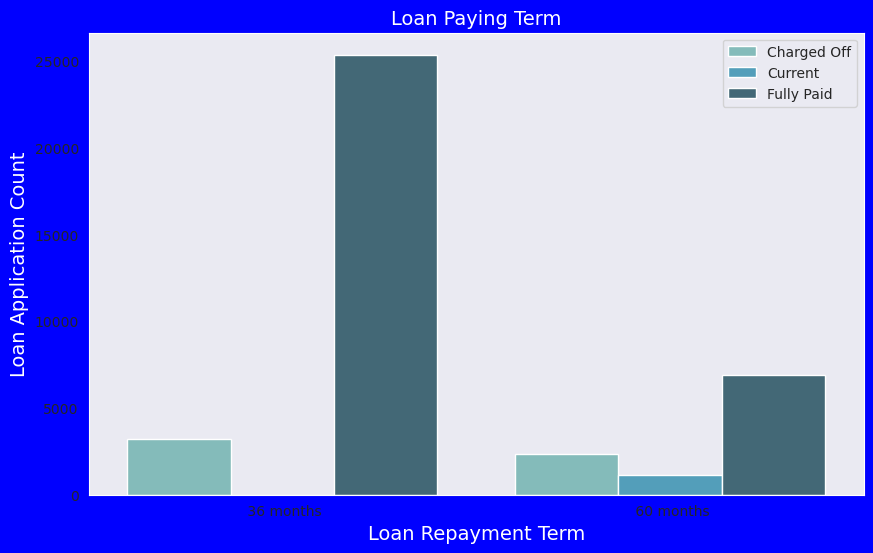

In [269]:
# Univariate Analysis - Ordered Categorical Variables- Loan Paying Term
#The `x` parameter specifies the column in the DataFrame to be plotted on the x-axis, the `data` parameter specifies the DataFrame, the `hue` parameter specifies the column to be used for grouping, and 
#the `palette` parameter specifies the color palette to be used for the plot.
plt.figure(figsize=(10,6),facecolor='b')
ax = sns.countplot(x="term",data=lend_data,hue='loan_status',palette='GnBu_d')
ax.set_title('Loan Paying Term',fontsize=14,color='w')
ax.set_xlabel('Loan Repayment Term',fontsize=14,color = 'w')
ax.set_ylabel('Loan Application Count',fontsize=14,color = 'w')      
ax.legend(bbox_to_anchor=(1, 1))
plt.show()

# Observations :
# Below plot shows that those who had taken loan to repay in 60 months had more number of applicants getting 
# charged off as compared to applicants who had taken loan for 36 months.

### Bivariate Analysis : 

# In this part of analysis, lets try to analyze the loan status against some important columns which might have played 
# important role in charged off of loans. Lets try to find proportion of charged offs in some categories.

# To calculate the proportion of charged off loans, will do these below steps:

# Group loans by different variables and loan status, get the count,use .unstack() to return a DataFrame.
# Since we’re going to use this for further analysis, it will be helpful to use .reset_index() to clean up the index. 
# Assign the new DataFrame to a variable.
# Create a simple derived column that sums charged off,current and fully paid loans for each category.
# Divide the number of charged off loans by the total number of loans to get the proportion of charged off loans. 
# Store this as another derived column.
# Finally, output the whole table, sorted by proportion of charged off in each category issued loans.

In [344]:
# Bivariate Analysis on annual income against Chargedoff_Percentage -

inc_range_vs_loan = lend_data.groupby(['annual_inc_cats', 'loan_status']).loan_status.count().unstack().fillna(0).reset_index()
inc_range_vs_loan['Total'] = inc_range_vs_loan['Charged Off'] + inc_range_vs_loan['Current'] + inc_range_vs_loan['Fully Paid'] 
inc_range_vs_loan['Chargedoff_Percentage'] = (inc_range_vs_loan['Charged Off']*100) / inc_range_vs_loan['Total']
inc_range_vs_loan.sort_values('Chargedoff_Percentage', ascending=False)

# Observations:
# Income range 80000+  has ~11% charged off rate
# Income range 0-20000 has ~20% charged off rate
# Notice that with increase in annual income charged off proportion got decreased. 

loan_status,annual_inc_cats,Charged Off,Current,Fully Paid,Total,Chargedoff_Percentage
0,0-20000,237,9,943,1189,19.932717
1,20000-40000,1514,170,7004,8688,17.426335
2,40000-60000,1729,345,9534,11608,14.894900
3,60000-80000,1024,240,6597,7861,13.026333
4,80000 +,1045,352,8185,9582,10.905865


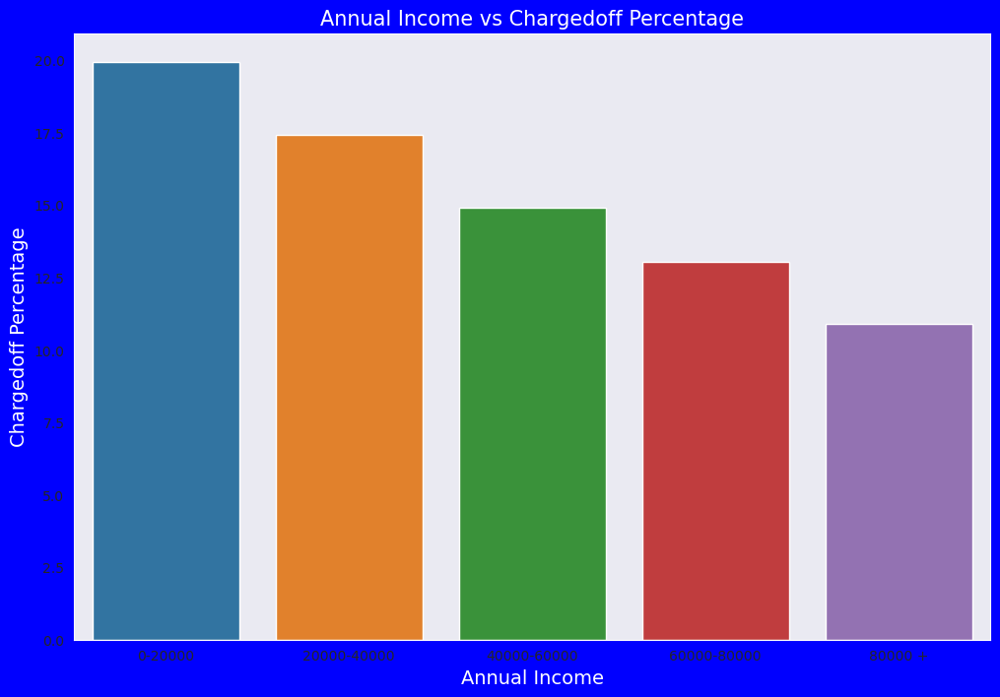

In [346]:
# Lets draw bar plots on data calculated above. Try to visualize the pattern to understand the data better.

fig, ax1 = plt.subplots(figsize=(12, 8),facecolor='b')
ax1.set_title('Annual Income vs Chargedoff Percentage',fontsize=15,color = 'w')
ax1=sns.barplot(x='annual_inc_cats', y='Chargedoff_Percentage', data=inc_range_vs_loan)
ax1.set_ylabel('Chargedoff Percentage',fontsize=14,color = 'w')
ax1.set_xlabel('Annual Income',fontsize=14,color='w')
plt.show()

# Observations:
# Income range 80000+  has less chances of charged off.
# Income range 0-20000 has high chances of charged off.
# Notice that with increase in annual income charged off proportion got decreased. 

In [340]:
# Bivariate Analysis on interest rate against Chargedoff_Proportion

interest_vs_loan = lend_data.groupby(['int_rate_cats', 'loan_status']).loan_status.count().unstack().fillna(0).reset_index()
interest_vs_loan['Total'] = interest_vs_loan['Charged Off'] + interest_vs_loan['Current'] + interest_vs_loan['Fully Paid'] 
interest_vs_loan['Chargedoff_Percentage'] = (interest_vs_loan['Charged Off']*100) / interest_vs_loan['Total']
interest_vs_loan.sort_values('Chargedoff_Percentage', ascending=False)

# Observations:
# interest rate less than 10% has very less chances of charged off (~7%). Intrest rates are starting from minimin 5 %. 
# interest rate more than 16% has good chnaces of charged off (~25%) as compared to other category intrest rates.
# Charged off proportion is increasing with higher intrest rates.

loan_status,int_rate_cats,Charged Off,Current,Fully Paid,Total,Chargedoff_Percentage
3,16 +,1241,348,3268,4857,25.550751
2,12.5-16,1985,328,9255,11568,17.159405
1,10-13,1217,266,7984,9467,12.855181
0,0-10,822,77,11316,12215,6.729431


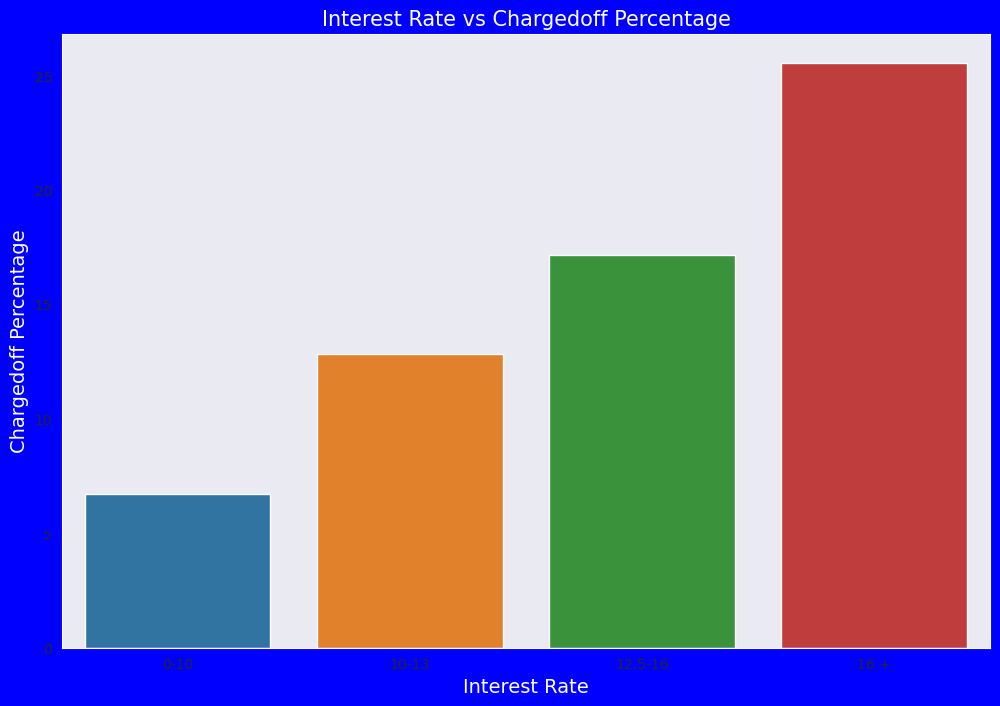

In [342]:
# Lets draw some bar plots on data calculated above. Try to visualize the pattern to understand the data better.

fig, ax1 = plt.subplots(figsize=(12, 8),facecolor='b')
ax1.set_title('Interest Rate vs Chargedoff Percentage',fontsize=15,color='w')
ax1=sns.barplot(x='int_rate_cats', y='Chargedoff_Percentage', data=interest_vs_loan)
ax1.set_xlabel('Interest Rate',fontsize=14,color='w')
ax1.set_ylabel('Chargedoff Percentage',fontsize=14,color = 'w')
plt.show()

# Observations:
# interest rate less than 10% has very less chances of charged off. Intrest rates are starting from minimin 5 %.
# interest rate more than 16% has good chnaces of charged off as compared to other category intrest rates.
# Charged off proportion is increasing with higher intrest rates.

In [332]:
# Bivariate Analysis on employment length against Chargedoff_Proportion

emplen_vs_loan = lend_data.groupby(['emp_length', 'loan_status']).loan_status.count().unstack().fillna(0).reset_index()
emplen_vs_loan['Total'] = emplen_vs_loan['Charged Off'] + emplen_vs_loan['Current'] + emplen_vs_loan['Fully Paid'] 
emplen_vs_loan['Chargedoff_Percentage'] = (emplen_vs_loan['Charged Off']*100) / emplen_vs_loan['Total']
emplen_vs_loan.sort_values('Chargedoff_Percentage', ascending=False)

# Observations:
# Those who are not working or have less than 1 year of work experience have high chances of getting charged off.
# It makes sense as with less or no experience they don't have source of income to repay loan.
# Rest of the applicants have more or less same chnaces of getting charged off.

loan_status,emp_length,Charged Off,Current,Fully Paid,Total,Chargedoff_Percentage
0,0,226,42,796,1064,21.240602
2,10,1304,383,6935,8622,15.124101
8,7,261,61,1424,1746,14.948454
1,1,1085,143,6476,7704,14.083593
6,5,451,87,2687,3225,13.984496
9,8,200,42,1198,1440,13.888889
7,6,303,57,1827,2187,13.854595
4,3,549,79,3399,4027,13.632977
5,4,454,93,2822,3369,13.475809
3,2,560,97,3651,4308,12.999071


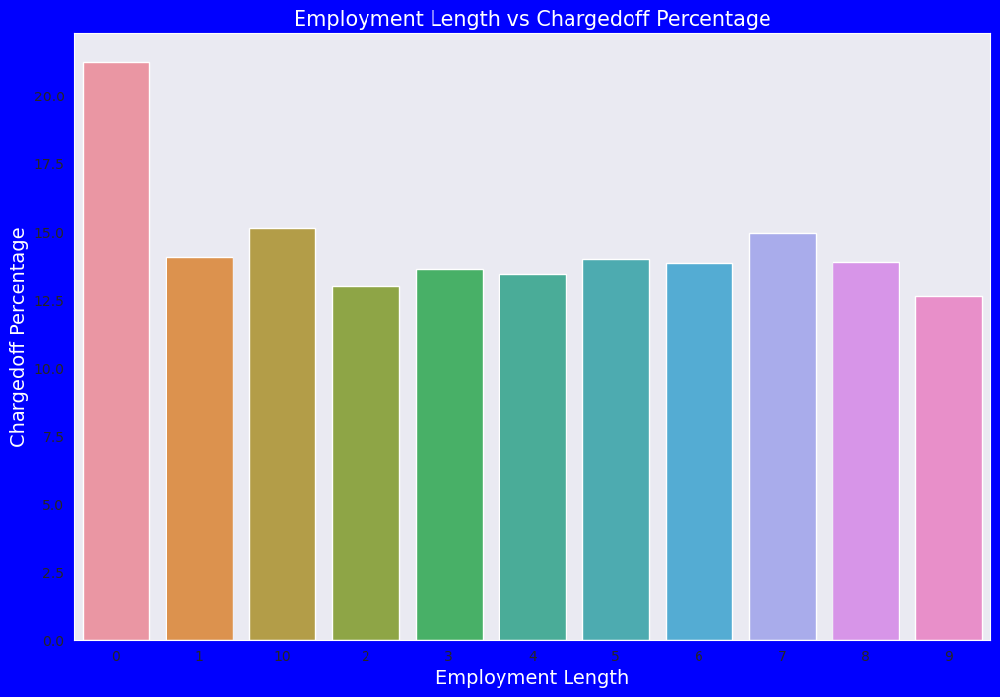

In [349]:
# Lets draw bar plots on data calculated above. Try to visualize the pattern to understand the data better.

fig, ax1 = plt.subplots(figsize=(12, 8),facecolor='b')
ax1.set_title('Employment Length vs Chargedoff Percentage',fontsize=15,color='w')
ax1=sns.barplot(x='emp_length', y='Chargedoff_Percentage', data=emplen_vs_loan)
ax1.set_xlabel('Employment Length',fontsize=14,color='w')
ax1.set_ylabel('Chargedoff Percentage',fontsize=14,color = 'w')
plt.show()

# Observations:
# Those who are not working or have less than 1 year of work experience have high chances of getting charged off.
# It makes sense as with less or no experience they don't have source of income to repay loan.
# Rest of the applicants have more or less same chnaces of getting charged off.


In [354]:
# Bivariate Analysis on verification_status against Chargedoff_Proportion

verfy_vs_loan = lend_data.groupby(['verification_status', 'loan_status']).loan_status.count().unstack().fillna(0).reset_index()
verfy_vs_loan['Total'] = verfy_vs_loan['Charged Off'] + verfy_vs_loan['Current'] + verfy_vs_loan['Fully Paid'] 
verfy_vs_loan['Chargedoff_Proportion'] = verfy_vs_loan['Charged Off'] / verfy_vs_loan['Total']
verfy_vs_loan.sort_values('Chargedoff_Proportion', ascending=False)

# Observations:
# There is not much difference in charged off proportion.
# This variable doesn't provide any insights for charged off. 

loan_status,verification_status,Charged Off,Current,Fully Paid,Total,Chargedoff_Proportion
2,Verified,2015,585,9822,12422,0.162212
1,Source Verified,1413,304,8033,9750,0.144923
0,Not Verified,2121,227,14408,16756,0.126582


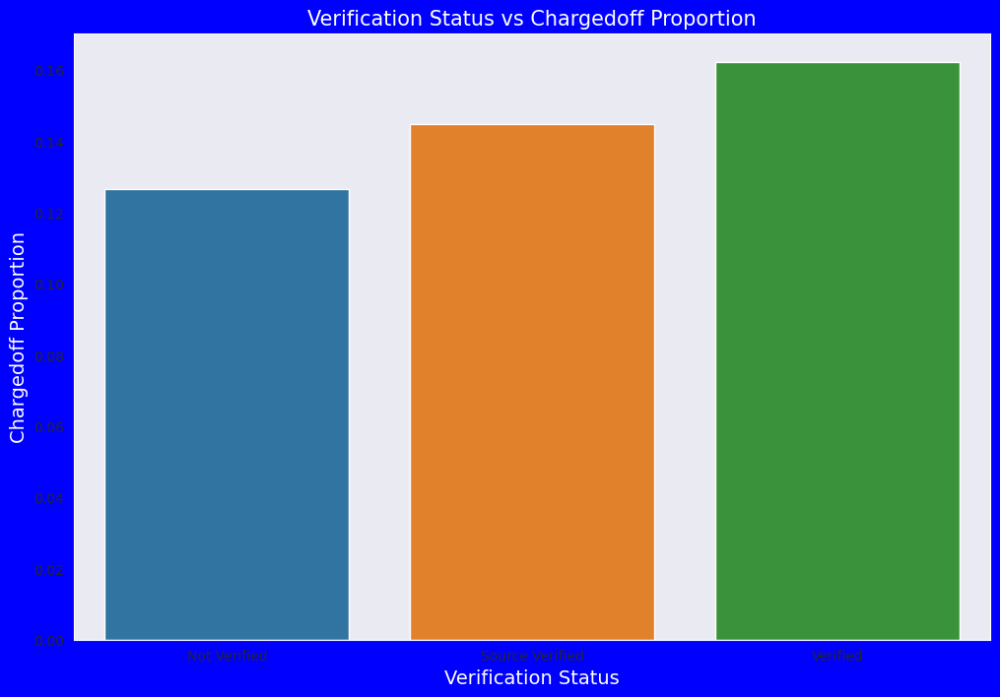

In [357]:
# Lets draw bar plots on data calculated above. Try to visualize the pattern to understand the data better.

fig, ax1 = plt.subplots(figsize=(12, 8),facecolor='b')
ax1.set_title('Verification Status vs Chargedoff Proportion',fontsize=15,color='w')
ax1=sns.barplot(x='verification_status', y='Chargedoff_Proportion', data=verfy_vs_loan)
ax1.set_xlabel('Verification Status',fontsize=14,color='w')
ax1.set_ylabel('Chargedoff Proportion',fontsize=14,color = 'w')
plt.show()

# Observations:
# There is not much difference in charged off proportion.
# This variable doesn't provide any insights for charged off.

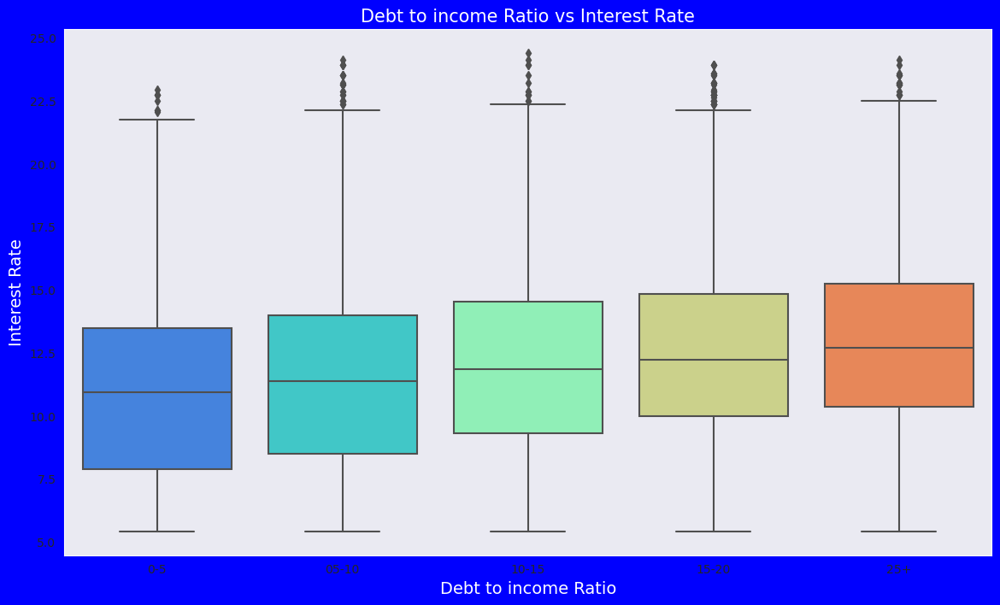

In [373]:
# Bivariate Analysis - dti vs Interest Rate
# Box Plot

plt.figure(figsize=(14,8),facecolor='b')
ax = sns.boxplot(y='int_rate', x='dti_cats', data =lend_data,palette='rainbow')
ax.set_title('Debt to income Ratio vs Interest Rate',fontsize=15,color='w')
ax.set_ylabel('Interest Rate',fontsize=14,color = 'w')
ax.set_xlabel('Debt to income Ratio',fontsize=14,color = 'w')
plt.show()

# Observations:
# If your DTI is low enough you may get a lower interest rate.
# Plot shows no significant variation but there is slight increase in interest rate with increase in DTI.

In [ ]:
### Lets draw a pair plot for multivariate analysis
# Pick few imporatnt columns from dataset separately.

loan_pair = lend_data[['loan_amnt', 'annual_inc', 'int_rate','loan_status']]
loan_pair.head()

# Take the log of below variables as they are heavily skewed
loan_pair['loan_amnt'] = np.log10(loan_pair['loan_amnt'])
loan_pair['annual_inc'] = np.log10(loan_pair['annual_inc'])
loan_pair['int_rate'] = np.log10(loan_pair['int_rate'])

# Create a pair plot colored by loan status with a density plot of the # diagonal and format the scatter plots.
#sns.pairplot(loan_pair, hue = 'loan_status', diag_kind = 'kde',
#             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             size = 4)
plt.show()

# Observation:
# Higher the intrest rate higher charged off ratio
# Higher the annual income higher the loan amount slightly.
# increase in number of charged off with increase in year.
# intrest rate is increasing with loan amount increase